<a href="https://colab.research.google.com/github/juandiego2205/Biosenales/blob/main/Proyecto_4/P4_JuanCaguasango_KevinGarcia.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**PROYECTO 4**

Kevin Estiven Garcia Jaramillo

Juan Diego Caguasango

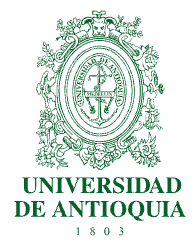

##**Instalar librerias**

In [48]:
!pip install PyWavelets

In [49]:
pip install neurokit2

In [50]:
pip install openpyxl

In [51]:
pip install imbalanced-learn


##**Importacion de Librerias y Carga de Archivos**


In [52]:
#importacion de las librerias necesarias para el calculo estadistico de las señales
from itertools import product
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import HTML
import zipfile
import seaborn as sns
from scipy import stats
from scipy.stats import mannwhitneyu
from scipy.signal import detrend
from google.colab import drive
from scipy.fftpack import fft as ft;
import scipy.io as sio;
import neurokit2 as nk

from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score

from math import sqrt
from sklearn.metrics import r2_score
from sklearn.metrics import classification_report,confusion_matrix
drive.mount('/content/drive')



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [53]:
!cp /content/drive/MyDrive/Proyecto_3/ECGDataDenoised.zip .
!unzip ECGDataDenoised.zip

Se han truncado las últimas 5000 líneas del flujo de salida.
  inflating: ECGDataDenoised/MUSE_20180116_125802_57000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125812_73000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125822_43000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125825_58000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125842_09000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125845_27000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125847_39000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125906_02000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125918_29000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125919_34000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125921_43000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125925_64000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125946_45000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125948_54000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_130000_80000.csv  
  inflati

##**Funciones del Sistema**

In [54]:
def procesar_datos_ecg(ruta_excel, ritmo_afib='AFIB', ritmo_sb='SB', frecuencia_muestreo=500, muestras=5000):
    # Cargar los datos desde el archivo Excel
    datos_base = pd.read_excel(ruta_excel)
    # Filtrar datos por ritmo cardíaco
    df_filtrado_afib = datos_base[datos_base['Rhythm'] == ritmo_afib]
    df_filtrado_sb = datos_base[datos_base['Rhythm'] == ritmo_sb]
    SexoF=df_filtrado_sb[df_filtrado_sb['Gender'] == "FEMALE"]
    SexoM=df_filtrado_sb[df_filtrado_sb['Gender'] == "MALE"]
    SexoAFIBF=df_filtrado_afib[df_filtrado_afib['Gender'] == "FEMALE"]
    SexoAFIBM=df_filtrado_afib[df_filtrado_afib['Gender'] == "MALE"]
    RegistrosAFIBF=(SexoAFIBF["FileName"]).tolist()
    RegistrosAFIBM=(SexoAFIBM["FileName"]).tolist()
    RegistrosSBF=(SexoF["FileName"]).tolist()
    RegistrosSBM=(SexoM["FileName"]).tolist()
    RegistrosAFIB=RegistrosAFIBF[:700]+RegistrosAFIBM[:900]
    RegistrosSB=RegistrosSBF[:700]+RegistrosSBM[:900]

    # Crear vectores de tiempo
    tiempo = np.linspace(0,muestras / frecuencia_muestreo,muestras)

    # Devolver los resultados en un diccionario
    return RegistrosAFIB,RegistrosSB,tiempo

In [55]:
def calcular_zscore(columna):
    media = columna.mean()                 # Calcular la media de la columna
    desviacion = columna.std()             # Calcular la desviación estándar de la columna
    return (columna - media) / desviacion

In [56]:
def compresion(x):
  x_min = np.min(x)
  x_max = np.max(x)
  t = np.linspace(0, len(x)/100, len(x))  # Vector de tiempo
  # Aplicar el método de compresión
  s = (x - x_min) / (x_max - x_min)
  return s

In [57]:
def procesar_detrend(AFIB, SB):
    # Obtener la tendencia inicial
    PrimerDetrend1 = detrend(SenalesAFIB[AFIB])
    PrimerDetrend2 = detrend(SenalesSB[SB])

    # Comprimir las señales detrend
    rescall1 = compresion(PrimerDetrend1)
    rescall2 = compresion(PrimerDetrend2)

    # Aplicar un segundo detrend
    SegundoDetrend1 = detrend(rescall1)
    SegundoDetrend2 = detrend(rescall2)

    return SegundoDetrend1, SegundoDetrend2

In [58]:
def analyze_ecg(data_list_1, data_list_2,ListaRegistro1, ListaRegistro2,sampling_rate):
    results = []
    combined_list = [(ecg_signal, 0) for ecg_signal in data_list_1] + [(ecg_signal, 1) for ecg_signal in data_list_2]
    combine_register = ListaRegistro1+ListaRegistro2
    for i, (ecg_signal, label) in enumerate(combined_list):
        if len(ecg_signal) == 0:
            print(f"Advertencia: La señal {i + 1} está vacía. Se omitirá.")
            continue
        try:
            register= combine_register[i]
            # Procesar la señal ECG
            ecg_signals, info = nk.ecg_process(ecg_signal, sampling_rate=sampling_rate)

            # Obtener los picos R detectados
            r_peaks = info["ECG_R_Peaks"]

            # Calcular intervalos RR (en segundos)
            rr_intervals = np.diff(r_peaks) / sampling_rate

            # Verificar que haya intervalos RR válidos
            if len(rr_intervals) == 0:
                print(f"Advertencia: La señal {i + 1} no tiene intervalos RR válidos. Se omitirá.")
                continue

            # Frecuencia ventricular (latidos por minuto)
            ventricular_rate = 60 / np.mean(rr_intervals)

            # Número de complejos QRS detectados
            qrs_count = len(r_peaks)
            # picos RR
            mean_rr = np.mean(r_peaks)  # Media de los intervalos RR
            std_rr = np.std(r_peaks)    # Desviación estándar
            cv_rr = std_rr / mean_rr

            # Analizar HRV en dominio temporal
            hrv_time = nk.hrv_time(r_peaks, sampling_rate=sampling_rate, show=False)

            # Extraer métricas específicas (como NN promedio)
            mean_nn = hrv_time.get("HRV_MeanNN", np.nan)

            # Si el valor es una Serie de pandas, extraer solo el valor numérico
            if isinstance(mean_nn, pd.Series):
                mean_nn = mean_nn.values[0]
            results.append({
                "Registro": register,
                "Ventricular Rate (bpm)": ventricular_rate,
                "QRS Count": qrs_count,
                "HRV MeanNN (ms)": mean_nn,
                "STD_RR": std_rr,
                "CV_RR": cv_rr,
                "Output": label  # 0 si la señal proviene de data_list_1, 1 si proviene de data_list_2
            })

        except Exception as e:
            print(f"Error al procesar la señal {i + 1}: {e}")
            continue
    return results


In [59]:
def graficar_resultados(ListaValoresECG1, ListaValoresECG2, AFIB, SB, SegundoDetrend1, SegundoDetrend2,Tiempo):
    # Crear el subplot 2x2
    fig, axs = plt.subplots(2, 2, figsize=(10, 8))

    # Graficar ECG1 y su segundo detrend
    axs[0, 0].plot(Tiempo,SenalesAFIB[AFIB], label="AFIB-ORIGINAL")
    axs[0, 0].set_title("AFIB-ORIGINAL")
    axs[0, 0].legend()

    axs[0, 1].plot(Tiempo,SegundoDetrend1, label="AFIB-DETREND", color="orange")
    axs[0, 1].set_title("AFIB-DETREND")
    axs[0, 1].legend()

    # Graficar ECG2 y su segundo detrend
    axs[1, 0].plot(Tiempo,SenalesSB[SB], label="SB-ORIGINAL")
    axs[1, 0].set_title("SB-ORIGINAL")
    axs[1, 0].legend()

    axs[1, 1].plot(Tiempo,SegundoDetrend2, label="SB-DETREND", color="green")
    axs[1, 1].set_title("SB-DETREND")
    axs[1, 1].legend()

    # Ajustar diseño
    plt.tight_layout()
    plt.show()

In [60]:
def procesar_ecg(lista_pacientes, lista_valores_ecg, archivo_zip):
    nueva_lista = [f"{elemento}.csv" for elemento in lista_pacientes]  # Generar lista de nombres de archivo

    with zipfile.ZipFile(archivo_zip, 'r') as zip_ref:
        # Iterar sobre cada archivo en el ZIP
        for archivo in zip_ref.namelist():
            # Verificar si el nombre del archivo está en la lista
            clean_filename = archivo.replace("ECGDataDenoised/", "")
            if clean_filename in nueva_lista:
                # Extraer el archivo
                zip_ref.extract(archivo)
                # Leer datos del archivo extraído
                data_sujetos = pd.read_csv(archivo, delimiter=',', names=['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6'])
                data_sujetos_n = data_sujetos['II'].values
                lista_valores_ecg.append(data_sujetos_n)

In [61]:

def procesar_datos_ecg2(ruta_excel,frecuencia_muestreo=500, muestras=5000):
    # Cargar los datos desde el archivo Excel
    datos_base = pd.read_excel(ruta_excel)

    # Filtrar datos por ritmo cardíaco
    Registros= (datos_base['FileName']).tolist()
    PatientAge  = datos_base["PatientAge"].tolist()
    Gender = datos_base["Gender"].tolist()
    QTIntrval= datos_base["QTInterval"].tolist()

    # Devolver los resultados en un diccionario
    return Registros,PatientAge,Gender,QTIntrval


In [62]:

def plot_confusion_matrix(cm, classes,
                          normalize,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    fig=plt.figure()
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

##**Filtrar Patologias y sus Caracteristicas**

In [63]:
# Inicializar listas
SenalesAFIB= []
SenalesSB = []

In [64]:
RegistrosAFIB,RegistrosSB,Tiempo=procesar_datos_ecg('/content/drive/MyDrive/Proyecto_3/Diagnostics.xlsx')




In [65]:
print("DATOS TOTALES AFIB: ",len(RegistrosAFIB))
print("DATOS TOTALES SB: ",len(RegistrosSB))

DATOS TOTALES AFIB:  1600
DATOS TOTALES SB:  1600


In [66]:
# Procesar los datos de los dos grupos
procesar_ecg(RegistrosAFIB, SenalesAFIB, "/content/ECGDataDenoised.zip")
procesar_ecg(RegistrosSB, SenalesSB, "/content/ECGDataDenoised.zip")

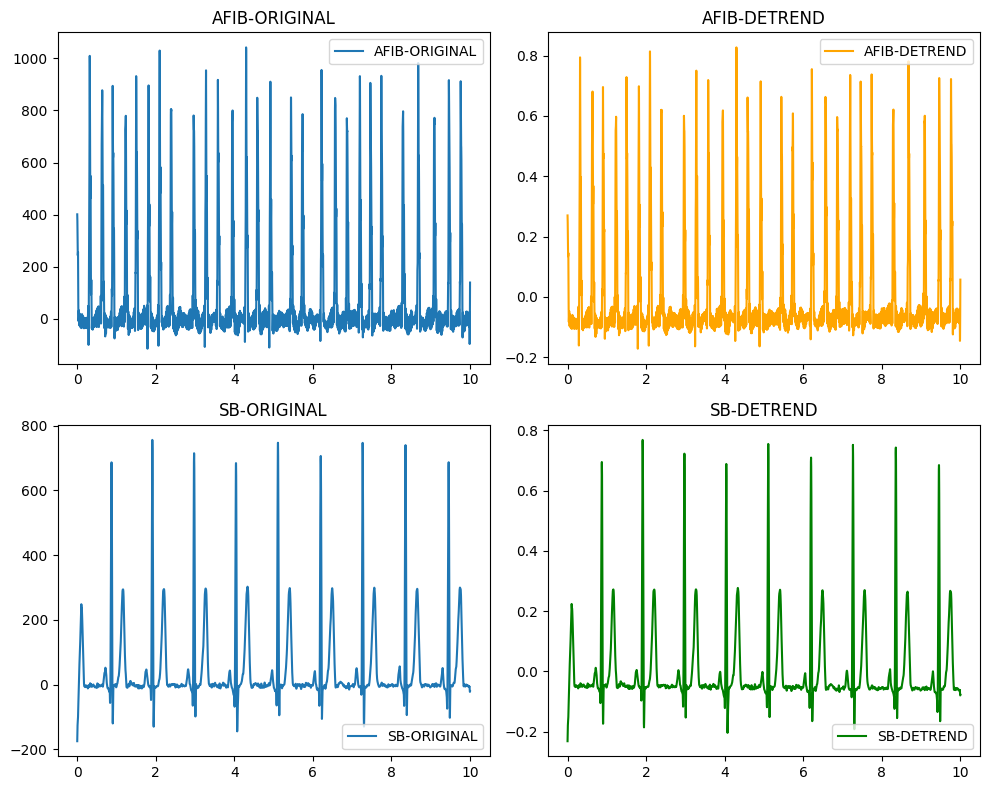

In [67]:
SD1,SD2=procesar_detrend(1400,1400)
graficar_resultados(SenalesAFIB, SenalesSB, 1400, 1400, SD1, SD2,Tiempo)
for i in range (len(SenalesSB)):
  RAFIB,RSB=procesar_detrend(i,i)
  SenalesAFIB[i]=RAFIB
  SenalesSB[i]=RSB

##**Neurokit Features Demonstration**


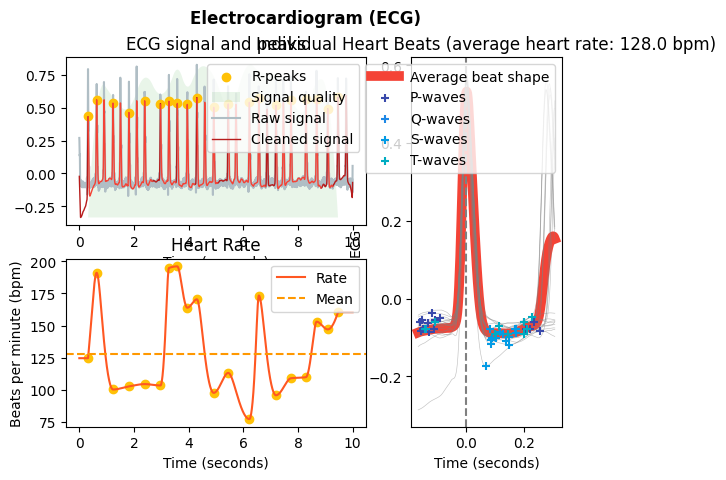

In [68]:
ecg_signals_SB_prueba, info = nk.ecg_process(SD1, sampling_rate=500)
nk.ecg_plot(ecg_signals_SB_prueba, info)

In [69]:
# Calcular intervalos RR (en segundos) -- Frecuencia Ventricular
rr_intervals = np.diff(info["ECG_R_Peaks"]) / info["sampling_rate"]
# Frecuencia ventricular (latidos por minuto)
ventricular_rate = 60 / np.mean(rr_intervals)
print(f"Frecuencia Ventricular: {ventricular_rate:.2f} bpm")

Frecuencia Ventricular: 124.67 bpm


In [70]:
qrs_count = len(info["ECG_R_Peaks"])
print(f"Total de complejos QRS detectados: {qrs_count}")


Total de complejos QRS detectados: 20


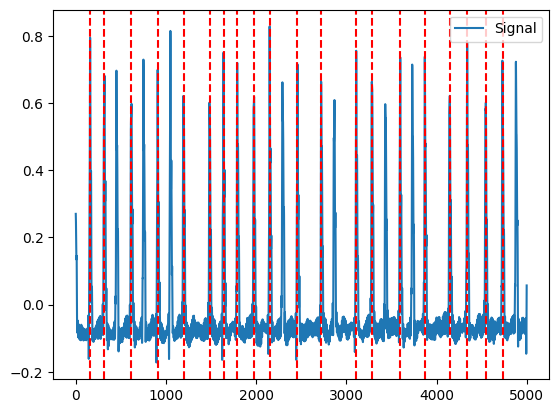

In [71]:
nk.events_plot(info["ECG_R_Peaks"], SD1)

HRV_MeanNN:  481.1578947368421


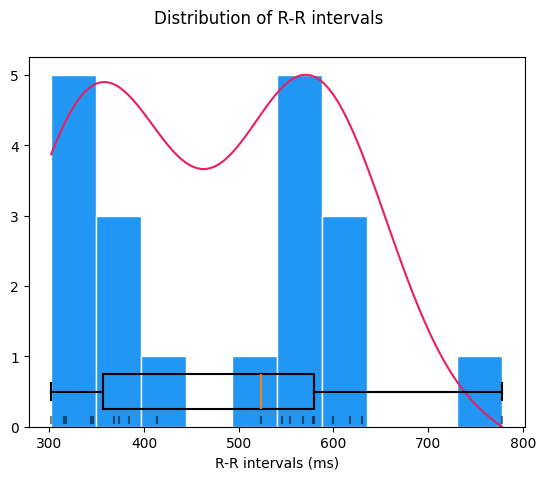

In [72]:
peaks, rate = nk.ecg_peaks(SD1,sampling_rate=500)
hrv_time = nk.hrv_time(peaks, sampling_rate=500, show=True)

print("HRV_MeanNN: ",hrv_time["HRV_MeanNN"][0])

#### justificacion de porque el QT se escogio del dataframe de la libreria original

In [73]:
# Calcular intervalo QT
t_offsets = np.array(info["ECG_T_Offsets"])
q_peaks= np.array(info["ECG_Q_Peaks"])

print("señales Q_Peaks que se evidencia Nan",q_peaks)
print("señales T_Peaks que se evidencia Nan",t_offsets)





señales Q_Peaks que se evidencia Nan [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan]
señales T_Peaks que se evidencia Nan [  nan   nan   nan   nan 1334.   nan 1765.   nan 2105.   nan 2527.   nan
   nan 3405.   nan   nan   nan 4421. 4632.   nan]


##**Caracteristicas**

In [74]:
Lista_features= analyze_ecg(SenalesAFIB,SenalesSB,RegistrosAFIB,RegistrosSB,500)
features_pacientes = pd.DataFrame(Lista_features)


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/neurokit2/signal/signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(


Error al procesar la señal 310: integer division or modulo by zero


/usr/local/lib/python3.10/dist-packages/neurokit2/signal/signal_fixpeaks.py:307: RuntimeWarning: invalid value encountered in divide
  mrrs /= th2
/usr/local/lib/python3.10/dist-packages/neurokit2/signal/signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(


Error al procesar la señal 697: cannot convert float NaN to integer


/usr/local/lib/python3.10/dist-packages/neurokit2/signal/signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(


Error al procesar la señal 815: cannot convert float NaN to integer
Error al procesar la señal 1982: The data length is too small to be segmented.


In [75]:
#Extraemos datos propios de la abquisiion
Registros,PatientAge,Gender,QT=procesar_datos_ecg2('/content/drive/MyDrive/Proyecto_3/Diagnostics.xlsx')
datos_paciente = pd.DataFrame({
    'Registro': Registros,
    'PatientAge': PatientAge,
    'Gender': Gender,
    'QTInterval': QT
})
# Para cambiar el genero a binario
datos_paciente['Gender'] = datos_paciente['Gender'].replace({'MALE': 0, 'FEMALE': 1})
Datos_complidados_pacientes = pd.merge(features_pacientes, datos_paciente, on='Registro', how='inner')  # Cambia 'inner' según el tipo de unión
Proyecto2Pacientes=pd.read_excel('/content/drive/MyDrive/Proyecto_3/DataFrame_SujetosP2.xlsx')
Proyecto2Pacientes = Proyecto2Pacientes.drop(columns=['ESTADO', 'sFSB'], errors='ignore')
Proyecto2Pacientes.rename(columns={'REGISTRO': 'Registro'}, inplace=True)
Proyecto2Pacientes = Proyecto2Pacientes.applymap(lambda x: str(x).replace('.csv', '') if isinstance(x, str) else x)
Datos_complidados_pacientes2 = pd.merge(Datos_complidados_pacientes, Proyecto2Pacientes, on='Registro', how='inner')  # Cambia 'inner' según el tipo de unión
Hsujetos = (
    Datos_complidados_pacientes2.style
    .set_table_styles(
        [
            {
                'selector': 'thead th',
                'props': [
                    ('background-color', '#2c3e50'),
                    ('color', 'white'),
                    ('font-weight', 'bold'),
                    ('border', '1px solid #2980b9'),
                    ('text-align', 'center'),
                    ('vertical-align', 'middle')
                ]
            },
            {
                'selector': 'caption',
                'props': [
                    ('caption-side', 'top'),
                    ('font-size', '22px'),
                    ('background-color', '#2980b9'),
                    ('color', 'white'),
                    ('font-weight', 'bold'),
                    ('text-align', 'center'),
                    ('padding', '12px')
                ]
            },
            {
                'selector': 'tbody td',
                'props': [
                    ('border', '1px solid #bdc3c7'),
                    ('padding', '8px'),
                    ('text-align', 'center'),
                    ('vertical-align', 'middle')
                ]
            }
        ]
    )
    .background_gradient(cmap='Blues')
    .set_caption("CARACTERISTICAS")
    .set_table_attributes('style="width: 100%; max-width: 1500px; margin: auto;"')  # Ajusta el ancho del DataFrame
)

# Convertir a HTML y mostrar centrado
display(HTML(f"<div style='text-align: center; width: 100%;'>{Hsujetos.to_html()}</div>"))



<ipython-input-75-02a5845bb115>:10: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  datos_paciente['Gender'] = datos_paciente['Gender'].replace({'MALE': 0, 'FEMALE': 1})
<ipython-input-75-02a5845bb115>:15: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  Proyecto2Pacientes = Proyecto2Pacientes.applymap(lambda x: str(x).replace('.csv', '') if isinstance(x, str) else x)


In [76]:
target_column = ['Output']
target_register = ['Registro']
predictors = list(set(list(Datos_complidados_pacientes2.columns))-set(target_column)-set(target_register))
Salida=Datos_complidados_pacientes2[target_column]
Datos_Nuevos=Datos_complidados_pacientes2[predictors]
print(Datos_Nuevos.shape)
Hsujetos = (
    Datos_Nuevos.style
    .set_table_styles(
        [
            {
                'selector': 'thead th',
                'props': [
                    ('background-color', '#2c3e50'),
                    ('color', 'white'),
                    ('font-weight', 'bold'),
                    ('border', '1px solid #2980b9'),
                    ('text-align', 'center'),
                    ('vertical-align', 'middle')
                ]
            },
            {
                'selector': 'caption',
                'props': [
                    ('caption-side', 'top'),
                    ('font-size', '22px'),
                    ('background-color', '#2980b9'),
                    ('color', 'white'),
                    ('font-weight', 'bold'),
                    ('text-align', 'center'),
                    ('padding', '12px')
                ]
            },
            {
                'selector': 'tbody td',
                'props': [
                    ('border', '1px solid #bdc3c7'),
                    ('padding', '8px'),
                    ('text-align', 'center'),
                    ('vertical-align', 'middle')
                ]
            }
        ]
    )
    .background_gradient(cmap='Blues')
    .set_caption("CARACTERISTICAS PARA LA RED NEURONAL")
    .set_table_attributes('style="width: 100%; max-width: 1500px; margin: auto;"')  # Ajusta el ancho del DataFrame
)

# Convertir a HTML y mostrar centrado
display(HTML(f"<div style='text-align: center; width: 100%;'>{Hsujetos.to_html()}</div>"))
Datos_Nuevos.to_excel('Datos_complidados_pacientes_5features.xlsx', index=False)

(3196, 9)


In [77]:
DFSB=Datos_complidados_pacientes2[Datos_complidados_pacientes2["Output"]==1]
DFAFIB=Datos_complidados_pacientes2[Datos_complidados_pacientes2["Output"]==0]
DFAFIBES=DFAFIB.describe()
DFSBES=DFSB.describe()
HSB = (
    DFAFIBES.style
    .set_table_styles(
        [
            {
                'selector': 'thead th',
                'props': [
                    ('background-color', '#2c3e50'),
                    ('color', 'white'),
                    ('font-weight', 'bold'),
                    ('border', '1px solid #4B0082'),
                    ('text-align', 'center'),
                    ('vertical-align', 'middle')
                ]
            },
            {
                'selector': 'caption',
                'props': [
                    ('caption-side', 'top'),
                    ('font-size', '22px'),
                    ('background-color', '#4B0082'),
                    ('color', 'white'),
                    ('font-weight', 'bold'),
                    ('text-align', 'center'),
                    ('padding', '12px')
                ]
            },
            {
                'selector': 'tbody td',
                'props': [
                    ('border', '1px solid #bdc3c7'),
                    ('padding', '8px'),
                    ('text-align', 'center'),
                    ('vertical-align', 'middle')
                ]
            }
        ]
    )
    .background_gradient(cmap='Purples')
    .set_caption("BRADICARDIA SINUSAL (SB)")
    .set_table_attributes('style="width: 100%; max-width: 1500px; margin: auto;"')  # Ajusta el ancho del DataFrame
)

# Convertir a HTML y mostrar centrado
display(HTML(f"<div style='text-align: center; width: 100%;'>{HSB.to_html()}</div>"))
Datos_Nuevos.to_excel('Datos_complidados_pacientes_5features.xlsx', index=False)

HAFIB = (
    DFAFIBES.style
    .set_table_styles(
        [
            {
                'selector': 'thead th',
                'props': [
                    ('background-color', '#2c3e50'),
                    ('color', 'white'),
                    ('font-weight', 'bold'),
                    ('border', '1px solid #006400'),
                    ('text-align', 'center'),
                    ('vertical-align', 'middle')
                ]
            },
            {
                'selector': 'caption',
                'props': [
                    ('caption-side', 'top'),
                    ('font-size', '22px'),
                    ('background-color', '#006400'),
                    ('color', 'white'),
                    ('font-weight', 'bold'),
                    ('text-align', 'center'),
                    ('padding', '12px')
                ]
            },
            {
                'selector': 'tbody td',
                'props': [
                    ('border', '1px solid #bdc3c7'),
                    ('padding', '8px'),
                    ('text-align', 'center'),
                    ('vertical-align', 'middle')
                ]
            }
        ]
    )
    .background_gradient(cmap='Greens')
    .set_caption("FIBRILACION AURICULAR (AFIB)")
    .set_table_attributes('style="width: 100%; max-width: 1500px; margin: auto;"')  # Ajusta el ancho del DataFrame
)

# Convertir a HTML y mostrar centrado
display(HTML(f"<div style='text-align: center; width: 100%;'>{HAFIB.to_html()}</div>"))
Datos_Nuevos.to_excel('Datos_complidados_pacientes_5features.xlsx', index=False)



,Ventricular Rate (bpm),QRS Count,HRV MeanNN (ms),STD_RR,CV_RR,Output,PatientAge,Gender,QTInterval,FMP
count,1597.000000,1597.000000,1597.000000,1597.000000,1597.000000,1597.000000,1597.000000,1597.000000,1597.000000,1597.000000
mean,95.059777,15.233563,675.323267,1384.966396,0.541841,0.000000,73.366938,0.437070,365.650595,4.268629
std,24.825510,4.010941,180.797750,59.368336,0.033827,0.000000,11.119339,0.496179,53.617046,3.262424
min,28.125000,4.000000,336.785714,1047.231283,0.383631,0.000000,30.000000,0.000000,164.000000,0.200000
25%,76.906644,12.000000,548.000000,1349.561294,0.520723,0.000000,67.000000,0.000000,330.000000,2.400000
50%,91.441970,15.000000,656.153846,1387.784107,0.541943,0.000000,75.000000,0.000000,366.000000,3.500000
75%,109.489051,18.000000,780.166667,1424.013322,0.564576,0.000000,82.000000,1.000000,400.000000,4.900000
max,178.154825,29.000000,2133.333333,1599.671107,0.744834,0.000000,98.000000,1.000000,688.000000,50.000000


,Ventricular Rate (bpm),QRS Count,HRV MeanNN (ms),STD_RR,CV_RR,Output,PatientAge,Gender,QTInterval,FMP
count,1597.000000,1597.000000,1597.000000,1597.000000,1597.000000,1597.000000,1597.000000,1597.000000,1597.000000,1597.000000
mean,95.059777,15.233563,675.323267,1384.966396,0.541841,0.000000,73.366938,0.437070,365.650595,4.268629
std,24.825510,4.010941,180.797750,59.368336,0.033827,0.000000,11.119339,0.496179,53.617046,3.262424
min,28.125000,4.000000,336.785714,1047.231283,0.383631,0.000000,30.000000,0.000000,164.000000,0.200000
25%,76.906644,12.000000,548.000000,1349.561294,0.520723,0.000000,67.000000,0.000000,330.000000,2.400000
50%,91.441970,15.000000,656.153846,1387.784107,0.541943,0.000000,75.000000,0.000000,366.000000,3.500000
75%,109.489051,18.000000,780.166667,1424.013322,0.564576,0.000000,82.000000,1.000000,400.000000,4.900000
max,178.154825,29.000000,2133.333333,1599.671107,0.744834,0.000000,98.000000,1.000000,688.000000,50.000000


In [78]:
columnas_a_normalizar = Datos_Nuevos.drop(columns=['Gender'])  # Excluir columna específica
Datos_Normalizados = columnas_a_normalizar.apply(calcular_zscore)

# Añadir la columna 'Gender' de vuelta
Datos_Normalizados['Gender'] = Datos_Nuevos['Gender']
HZSCORE = (
    Datos_Normalizados.style
    .set_table_styles(
        [
            {
                'selector': 'thead th',
                'props': [
                    ('background-color', '#2c3e50'),
                    ('color', 'white'),
                    ('font-weight', 'bold'),
                    ('border', '1px solid #FF5733'),
                    ('text-align', 'center'),
                    ('vertical-align', 'middle')
                ]
            },
            {
                'selector': 'caption',
                'props': [
                    ('caption-side', 'top'),
                    ('font-size', '22px'),
                    ('background-color', '#FF5733'),
                    ('color', 'white'),
                    ('font-weight', 'bold'),
                    ('text-align', 'center'),
                    ('padding', '12px')
                ]
            },
            {
                'selector': 'tbody td',
                'props': [
                    ('border', '1px solid #bdc3c7'),
                    ('padding', '8px'),
                    ('text-align', 'center'),
                    ('vertical-align', 'middle')
                ]
            }
        ]
    )
    .background_gradient(cmap='Reds')
    .set_caption("CARACTERISTICAS NORMALIZADAS")
    .set_table_attributes('style="width: 100%; max-width: 1500px; margin: auto;"')  # Ajusta el ancho del DataFrame
)

# Convertir a HTML y mostrar centrado
display(HTML(f"<div style='text-align: center; width: 100%;'>{HZSCORE.to_html()}</div>"))
Datos_Nuevos.to_excel('Datos_complidados_pacientes_5features.xlsx', index=False)

##**Redes Neuranales Implementadas**

In [79]:
# Creating the Training and Test Datasets
Values_Normalizados= Datos_Normalizados.values
Values_salida = Salida.values

X_train, X_test, y_train, y_test = train_test_split(Values_Normalizados, Values_salida, test_size=0.30, random_state=40)
y_test = np.squeeze(y_test)
y_train = np.squeeze(y_train)

print("Shape de datos de entrenamiento: ",X_train.shape)
print("Shape de datos de entrenamiento - Salida: ",y_train.shape)

print("Shape de datos de Testeo: ",X_test.shape)
print("Shape de datos de Testeo - Salida: ",y_test.shape)

#Red neuronal de perceptrón multicapa (MLP)
mlp = MLPClassifier(hidden_layer_sizes=(10,29,1), activation='relu', solver='adam', max_iter=2000, random_state=40)
mlp_2 = MLPClassifier(hidden_layer_sizes=(10,41,1), activation='relu', solver='adam', max_iter=2000, random_state=40)
mlp_3= MLPClassifier(hidden_layer_sizes=(10,58,1), activation='relu', solver='adam', max_iter=2000, random_state=40)

print(" ")
print("RED NEURONAL 1 IMPLEMENTADA: ",mlp)
print("RED NEURONAL 2 IMPLEMENTADA: ",mlp_2)
print("RED NEURONAL 3 IMPLEMENTADA: ",mlp_3)

# CROSS VALIDATION
scores = cross_val_score(mlp, X_train, y_train, cv=10)
scores_2 = cross_val_score(mlp_2, X_train, y_train, cv=10)
scores_3 = cross_val_score(mlp_3, X_train, y_train, cv=10)

print(" ")
print(f"Precisión media con validación cruzada para RED NEURONAL 1: {scores.mean()}")
print(f"Precisión media con validación cruzada para RED NEURONAL 2: {scores_2.mean()}")
print(f"Precisión media con validación cruzada para RED NEURONAL 3: {scores_3.mean()}")

Shape de datos de entrenamiento:  (2237, 9)
Shape de datos de entrenamiento - Salida:  (2237,)
Shape de datos de Testeo:  (959, 9)
Shape de datos de Testeo - Salida:  (959,)
 
RED NEURONAL 1 IMPLEMENTADA:  MLPClassifier(hidden_layer_sizes=(10, 29, 1), max_iter=2000, random_state=40)
RED NEURONAL 2 IMPLEMENTADA:  MLPClassifier(hidden_layer_sizes=(10, 41, 1), max_iter=2000, random_state=40)
RED NEURONAL 3 IMPLEMENTADA:  MLPClassifier(hidden_layer_sizes=(10, 58, 1), max_iter=2000, random_state=40)
 
Precisión media con validación cruzada para RED NEURONAL 1: 0.9543962203715566
Precisión media con validación cruzada para RED NEURONAL 2: 0.9544102338244717
Precisión media con validación cruzada para RED NEURONAL 3: 0.9535053651505445


### RED NEURONAL 1

In [80]:
mlp.fit( X_train, y_train)
predict_train = mlp.predict(X_train)
predict_test = mlp.predict(X_test)

target_names = ['SB', 'AFIB']
# Generar el classification_report
report_train = classification_report(y_train, predict_train, target_names=target_names)
report_test= classification_report(y_test,predict_test,target_names=target_names)

print("Classification Report train: ")
print(report_train)
print(" ")
print("Classification Report test: ")
print(report_test)

Classification Report train: 
              precision    recall  f1-score   support

          SB       1.00      0.97      0.98      1098
        AFIB       0.97      1.00      0.98      1139

    accuracy                           0.98      2237
   macro avg       0.98      0.98      0.98      2237
weighted avg       0.98      0.98      0.98      2237

 
Classification Report test: 
              precision    recall  f1-score   support

          SB       0.96      0.95      0.95       499
        AFIB       0.94      0.95      0.95       460

    accuracy                           0.95       959
   macro avg       0.95      0.95      0.95       959
weighted avg       0.95      0.95      0.95       959



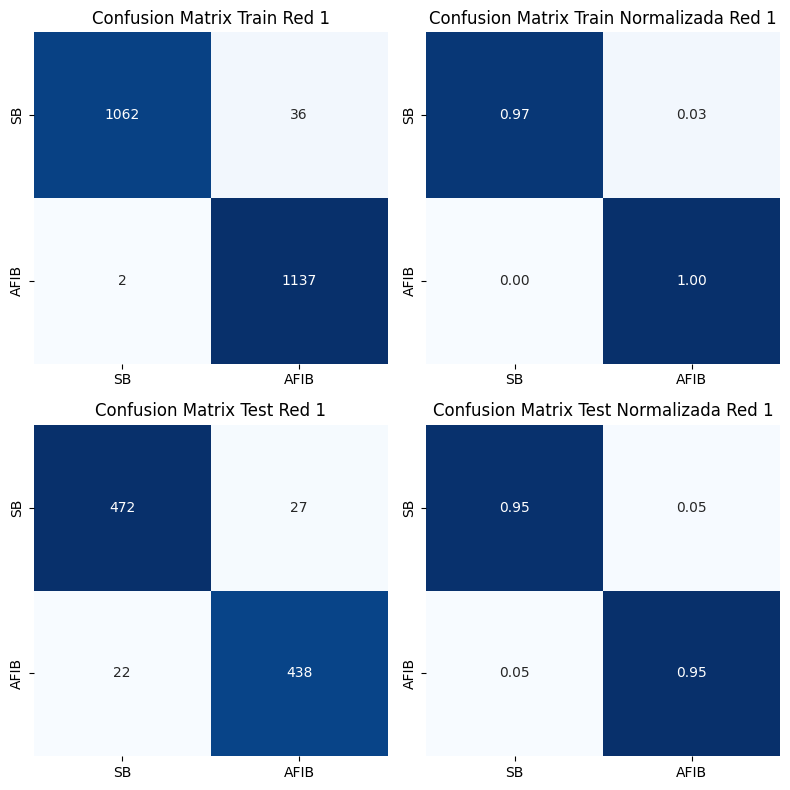

In [81]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Crear la figura
fig = plt.figure(figsize=(8, 8))

# Usar gridspec para el diseño de 2x2 subplots
gs = fig.add_gridspec(2, 2)

# Primer subplot: Confusión en entrenamiento, sin normalizar
ax1 = fig.add_subplot(gs[0, 0])
mc_train = confusion_matrix(y_train, predict_train)
sns.heatmap(mc_train, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=target_names, yticklabels=target_names, ax=ax1)
ax1.set_title('Confusion Matrix Train Red 1')

# Segundo subplot: Confusión en entrenamiento, normalizada
ax2 = fig.add_subplot(gs[0, 1])
mc_train = confusion_matrix(y_train, predict_train, normalize='true')
sns.heatmap(mc_train, annot=True, fmt='.2f', cmap='Blues', cbar=False,
            xticklabels=target_names, yticklabels=target_names, ax=ax2)
ax2.set_title('Confusion Matrix Train Normalizada Red 1')

# Tercer subplot: Confusión en test, sin normalizar
ax3 = fig.add_subplot(gs[1, 0])
mc_test = confusion_matrix(y_test, predict_test)
sns.heatmap(mc_test, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=target_names, yticklabels=target_names, ax=ax3)
ax3.set_title('Confusion Matrix Test Red 1')

# Cuarto subplot: Confusión en test, normalizada
ax4 = fig.add_subplot(gs[1, 1])
mc_test = confusion_matrix(y_test, predict_test, normalize='true')
sns.heatmap(mc_test, annot=True, fmt='.2f', cmap='Blues', cbar=False,
            xticklabels=target_names, yticklabels=target_names, ax=ax4)
ax4.set_title('Confusion Matrix Test Normalizada Red 1')

# Ajustar la disposición para evitar superposición
plt.tight_layout()
plt.show()


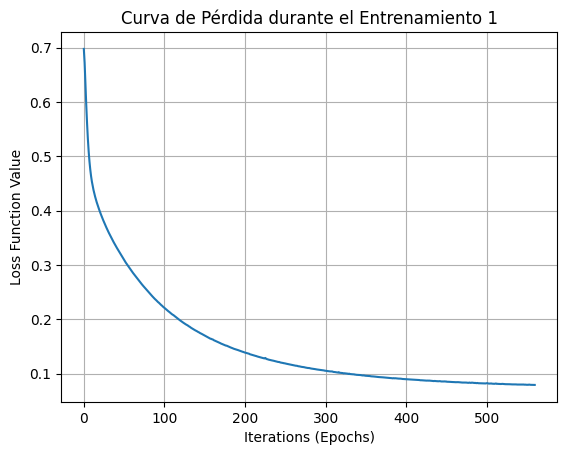

In [82]:
plt.plot(mlp.loss_curve_)
plt.xlabel('Iteración')
plt.ylabel('Función de Pérdida')
plt.title('Curva de Pérdida durante el Entrenamiento 1')
plt.grid(True)
plt.xlabel('Iterations (Epochs)')  # Eje X
plt.ylabel('Loss Function Value')   # Eje Y
plt.show()

### RED NEURONAL 2

In [83]:
mlp_2.fit( X_train, y_train)
predict_train_2 = mlp_2.predict(X_train)
predict_test_2 = mlp_2.predict(X_test)

target_names = ['SB', 'AFIB']
# Generar el classification_report
report_train_2 = classification_report(y_train, predict_train_2, target_names=target_names)
report_test_2= classification_report(y_test,predict_test_2,target_names=target_names)

print("Classification Report train: ")
print(report_train_2)
print(" ")
print("Classification Report test: ")
print(report_test_2)

Classification Report train: 
              precision    recall  f1-score   support

          SB       0.98      0.98      0.98      1098
        AFIB       0.98      0.99      0.98      1139

    accuracy                           0.98      2237
   macro avg       0.98      0.98      0.98      2237
weighted avg       0.98      0.98      0.98      2237

 
Classification Report test: 
              precision    recall  f1-score   support

          SB       0.95      0.96      0.96       499
        AFIB       0.96      0.94      0.95       460

    accuracy                           0.95       959
   macro avg       0.95      0.95      0.95       959
weighted avg       0.95      0.95      0.95       959



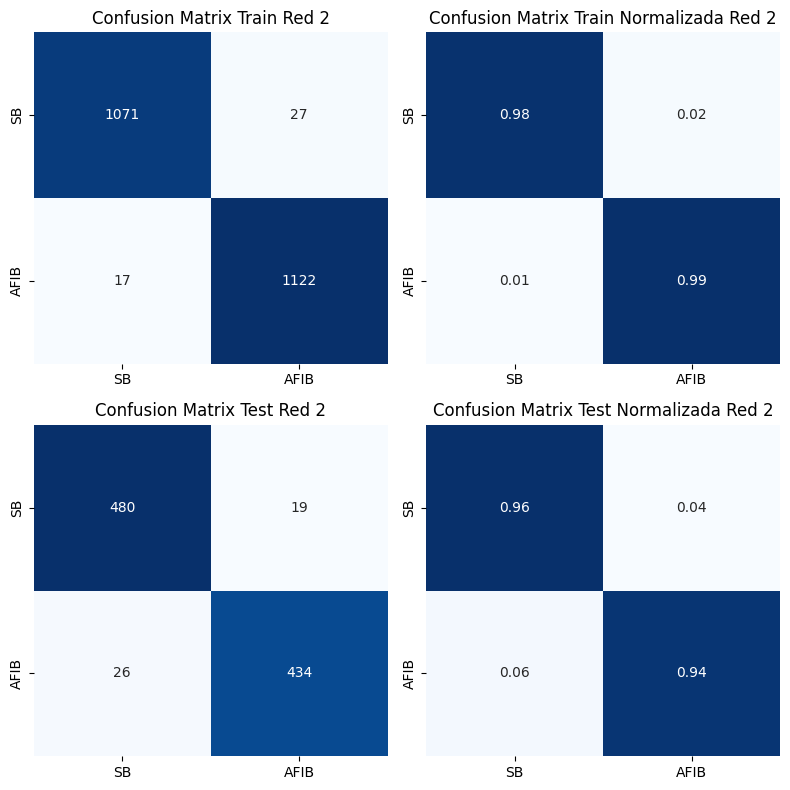

In [84]:
# Crear la figura
fig = plt.figure(figsize=(8, 8))

# Usar gridspec para el diseño de 2x2 subplots
gs = fig.add_gridspec(2, 2)

# Primer subplot: Confusión en entrenamiento, sin normalizar
ax1 = fig.add_subplot(gs[0, 0])
mc_train = confusion_matrix(y_train, predict_train_2)
sns.heatmap(mc_train, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=target_names, yticklabels=target_names, ax=ax1)
ax1.set_title('Confusion Matrix Train Red 2')

# Segundo subplot: Confusión en entrenamiento, normalizada
ax2 = fig.add_subplot(gs[0, 1])
mc_train = confusion_matrix(y_train, predict_train_2, normalize='true')
sns.heatmap(mc_train, annot=True, fmt='.2f', cmap='Blues', cbar=False,
            xticklabels=target_names, yticklabels=target_names, ax=ax2)
ax2.set_title('Confusion Matrix Train Normalizada Red 2')

# Tercer subplot: Confusión en test, sin normalizar
ax3 = fig.add_subplot(gs[1, 0])
mc_test = confusion_matrix(y_test, predict_test_2)
sns.heatmap(mc_test, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=target_names, yticklabels=target_names, ax=ax3)
ax3.set_title('Confusion Matrix Test Red 2')

# Cuarto subplot: Confusión en test, normalizada
ax4 = fig.add_subplot(gs[1, 1])
mc_test = confusion_matrix(y_test, predict_test_2, normalize='true')
sns.heatmap(mc_test, annot=True, fmt='.2f', cmap='Blues', cbar=False,
            xticklabels=target_names, yticklabels=target_names, ax=ax4)
ax4.set_title('Confusion Matrix Test Normalizada Red 2')

# Ajustar la disposición para evitar superposición
plt.tight_layout()
plt.show()

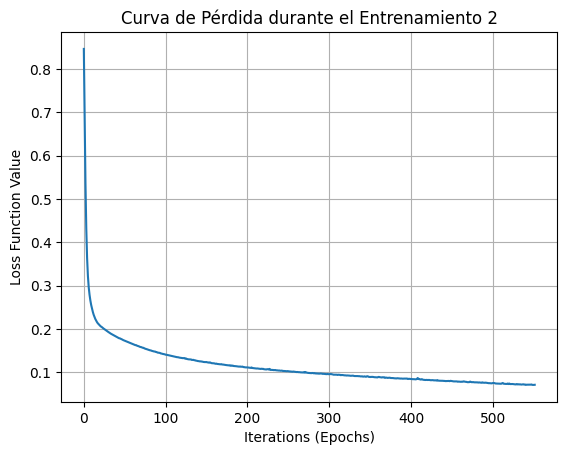

In [85]:
plt.plot(mlp_2.loss_curve_)
plt.xlabel('Iteración')
plt.ylabel('Función de Pérdida')
plt.title('Curva de Pérdida durante el Entrenamiento 2')
plt.grid(True)
plt.xlabel('Iterations (Epochs)')  # Eje X
plt.ylabel('Loss Function Value')   # Eje Y
plt.show()

### RED NEURONAL 3

In [86]:
mlp_3.fit( X_train, y_train)
predict_train_3 = mlp_3.predict(X_train)
predict_test_3 = mlp_3.predict(X_test)

target_names = ['SB', 'AFIB']
# Generar el classification_report
report_train_3 = classification_report(y_train, predict_train_3, target_names=target_names)
report_test_3= classification_report(y_test,predict_test_3,target_names=target_names)

print("Classification Report train: ")
print(report_train_3)
print(" ")
print("Classification Report test: ")
print(report_test_3)

Classification Report train: 
              precision    recall  f1-score   support

          SB       0.99      0.98      0.99      1098
        AFIB       0.98      0.99      0.99      1139

    accuracy                           0.99      2237
   macro avg       0.99      0.99      0.99      2237
weighted avg       0.99      0.99      0.99      2237

 
Classification Report test: 
              precision    recall  f1-score   support

          SB       0.95      0.95      0.95       499
        AFIB       0.95      0.95      0.95       460

    accuracy                           0.95       959
   macro avg       0.95      0.95      0.95       959
weighted avg       0.95      0.95      0.95       959



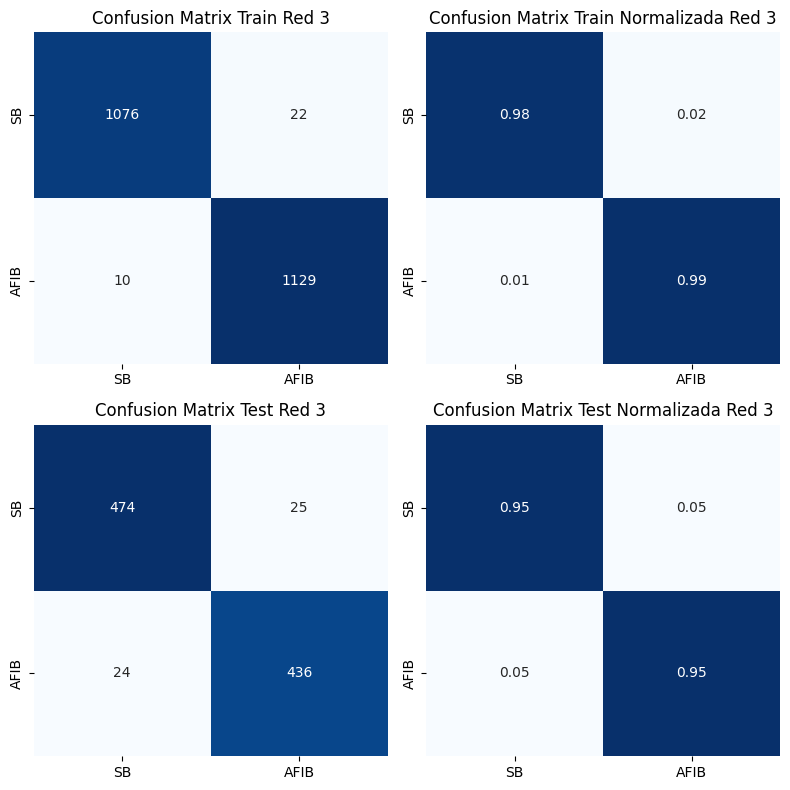

In [87]:
# Crear la figura
fig = plt.figure(figsize=(8, 8))

# Usar gridspec para el diseño de 2x2 subplots
gs = fig.add_gridspec(2, 2)

# Primer subplot: Confusión en entrenamiento, sin normalizar
ax1 = fig.add_subplot(gs[0, 0])
mc_train = confusion_matrix(y_train, predict_train_3)
sns.heatmap(mc_train, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=target_names, yticklabels=target_names, ax=ax1)
ax1.set_title('Confusion Matrix Train Red 3')

# Segundo subplot: Confusión en entrenamiento, normalizada
ax2 = fig.add_subplot(gs[0, 1])
mc_train = confusion_matrix(y_train, predict_train_3, normalize='true')
sns.heatmap(mc_train, annot=True, fmt='.2f', cmap='Blues', cbar=False,
            xticklabels=target_names, yticklabels=target_names, ax=ax2)
ax2.set_title('Confusion Matrix Train Normalizada Red 3')

# Tercer subplot: Confusión en test, sin normalizar
ax3 = fig.add_subplot(gs[1, 0])
mc_test = confusion_matrix(y_test, predict_test_3)
sns.heatmap(mc_test, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=target_names, yticklabels=target_names, ax=ax3)
ax3.set_title('Confusion Matrix Test Red 3')

# Cuarto subplot: Confusión en test, normalizada
ax4 = fig.add_subplot(gs[1, 1])
mc_test = confusion_matrix(y_test, predict_test_3, normalize='true')
sns.heatmap(mc_test, annot=True, fmt='.2f', cmap='Blues', cbar=False,
            xticklabels=target_names, yticklabels=target_names, ax=ax4)
ax4.set_title('Confusion Matrix Test Normalizada Red 3')

# Ajustar la disposición para evitar superposición
plt.tight_layout()
plt.show()

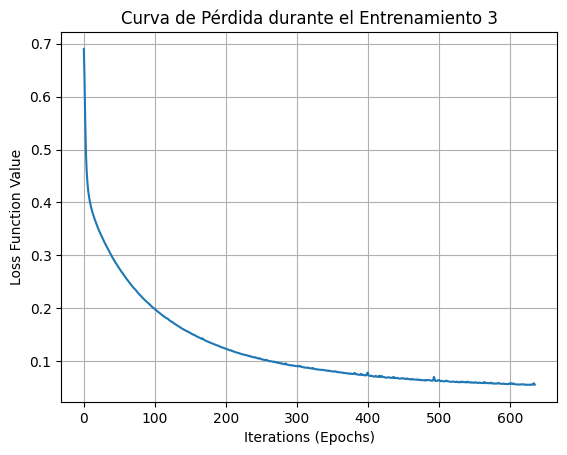

In [88]:
plt.plot(mlp_3.loss_curve_)
plt.xlabel('Iteración')
plt.ylabel('Función de Pérdida')
plt.title('Curva de Pérdida durante el Entrenamiento 3')
plt.grid(True)
plt.xlabel('Iterations (Epochs)')  # Eje X
plt.ylabel('Loss Function Value')   # Eje Y
plt.show()

### Resumen

In [89]:
print(report_train)
print(" ")
print(report_test)
print(" ")
print(report_train_2)
print(" ")
print(report_test_2)
print(" ")
print(report_train_3)
print(" ")
print(report_test_3)

              precision    recall  f1-score   support

          SB       1.00      0.97      0.98      1098
        AFIB       0.97      1.00      0.98      1139

    accuracy                           0.98      2237
   macro avg       0.98      0.98      0.98      2237
weighted avg       0.98      0.98      0.98      2237

 
              precision    recall  f1-score   support

          SB       0.96      0.95      0.95       499
        AFIB       0.94      0.95      0.95       460

    accuracy                           0.95       959
   macro avg       0.95      0.95      0.95       959
weighted avg       0.95      0.95      0.95       959

 
              precision    recall  f1-score   support

          SB       0.98      0.98      0.98      1098
        AFIB       0.98      0.99      0.98      1139

    accuracy                           0.98      2237
   macro avg       0.98      0.98      0.98      2237
weighted avg       0.98      0.98      0.98      2237

 
             

##**Modelos K-Means y SVM**

###K-means

In [95]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.metrics import make_scorer

# Cargar o definir tus datos
X = Datos_Nuevos  # Características
y_true = Salida   # Etiquetas (0 para SB, 1 para AFIB)

# Dividir los datos en entrenamiento y prueba (esto es importante para validación)
X_traink, X_testk, y_traink, y_testk = train_test_split(X, y_true, test_size=0.3, random_state=40)

# Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_traink)
X_test_scaled = scaler.transform(X_testk)

# Aplicar K-means con 2 clústeres (porque hay dos patologías)
kmeans = KMeans(n_clusters=2, random_state=40)
kmeans.fit(X_train_scaled)

# Predicciones de K-means para entrenamiento
y_pred_train = kmeans.labels_

# Ajuste de etiquetas si es necesario
accuracy_train = max(accuracy_score(y_traink, y_pred_train), accuracy_score(y_traink, 1 - y_pred_train))

# Matriz de confusión para el conjunto de entrenamiento
cm_train = confusion_matrix(y_traink, y_pred_train)

# Validación cruzada con KMeans
cross_val_accuracy = cross_val_score(kmeans, X_train_scaled, y_traink, cv=10, scoring=make_scorer(accuracy_score))
mean_cv_accuracy = np.mean(cross_val_accuracy)

# Predicciones para el conjunto de validación (prueba)
y_pred_test = kmeans.predict(X_test_scaled)
accuracy_test = accuracy_score(y_testk, y_pred_test)

# Matriz de confusión para el conjunto de prueba
cm_test = confusion_matrix(y_testk, y_pred_test)

# Imprimir resultados
print(f'Exactitud en el conjunto de entrenamiento: {accuracy_train:.2f}')
print(f'Exactitud en el conjunto de validación: {accuracy_test:.2f}')
print(f'Exactitud media en validación cruzada (10 particiones): {mean_cv_accuracy:.2f}')




Exactitud en el conjunto de entrenamiento: 0.91
Exactitud en el conjunto de validación: 0.91
Exactitud media en validación cruzada (10 particiones): 0.58


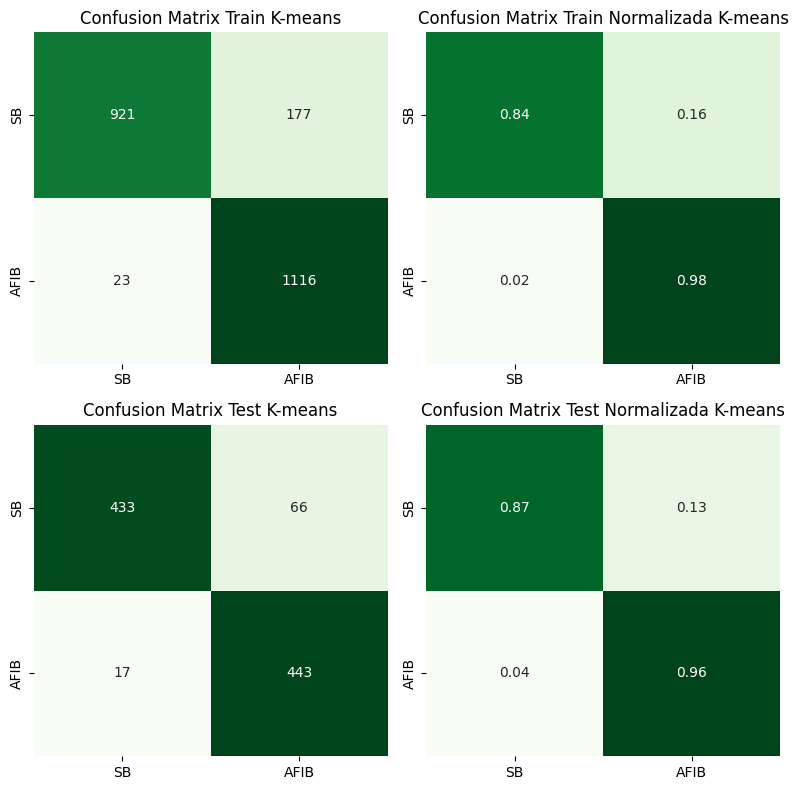

In [96]:
# Crear la figura
fig = plt.figure(figsize=(8, 8))

# Usar gridspec para el diseño de 2x2 subplots
gs = fig.add_gridspec(2, 2)

# Primer subplot: Confusión en entrenamiento, sin normalizar
ax1 = fig.add_subplot(gs[0, 0])
mc_train = confusion_matrix(y_traink, y_pred_train)
sns.heatmap(mc_train, annot=True, fmt='d', cmap='Greens', cbar=False,
            xticklabels=target_names, yticklabels=target_names, ax=ax1)
ax1.set_title('Confusion Matrix Train K-means')

# Segundo subplot: Confusión en entrenamiento, normalizada
ax2 = fig.add_subplot(gs[0, 1])
mc_train = confusion_matrix(y_traink, y_pred_train, normalize='true')
sns.heatmap(mc_train, annot=True, fmt='.2f', cmap='Greens', cbar=False,
            xticklabels=target_names, yticklabels=target_names, ax=ax2)
ax2.set_title('Confusion Matrix Train Normalizada K-means')

# Tercer subplot: Confusión en test, sin normalizar
ax3 = fig.add_subplot(gs[1, 0])
mc_test = confusion_matrix(y_testk, y_pred_test)
sns.heatmap(mc_test, annot=True, fmt='d', cmap='Greens', cbar=False,
            xticklabels=target_names, yticklabels=target_names, ax=ax3)
ax3.set_title('Confusion Matrix Test K-means')

# Cuarto subplot: Confusión en test, normalizada
ax4 = fig.add_subplot(gs[1, 1])
mc_test = confusion_matrix(y_testk, y_pred_test, normalize='true')
sns.heatmap(mc_test, annot=True, fmt='.2f', cmap='Greens', cbar=False,
            xticklabels=target_names, yticklabels=target_names, ax=ax4)
ax4.set_title('Confusion Matrix Test Normalizada K-means')

# Ajustar la disposición para evitar superposición
plt.tight_layout()
plt.show()

###SVM

In [97]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import numpy as np

# Seleccionar características y etiquetas
X = Datos_Nuevos  # Reemplaza con las columnas de características
y = Salida  # Columna con etiquetas: 0 (SB) y 1 (AFIB)

# Dividir los datos en conjunto de entrenamiento y prueba
X_trains, X_tests, y_trains, y_tests = train_test_split(X, y, test_size=0.3, random_state=40)

# Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_trains)
X_test_scaled = scaler.transform(X_tests)

# Entrenar el modelo SVM con un kernel lineal
svm_model = SVC(kernel='linear', C=1, random_state=40, max_iter=2000, probability=True)  # Ajustar max_iter si es necesario
svm_model.fit(X_train_scaled, y_trains)

# Evaluar en conjunto de entrenamiento
y_train_pred = svm_model.predict(X_train_scaled)
# Evaluar en conjunto de prueba
y_test_pred = svm_model.predict(X_test_scaled)
print('Reporte de Clasificación (Entrenamiento):')
print(classification_report(y_trains, y_train_pred))
print('\nReporte de Clasificación (Prueba):')
print(classification_report(y_tests, y_test_pred))


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Reporte de Clasificación (Entrenamiento):
              precision    recall  f1-score   support

           0       0.97      0.94      0.96      1098
           1       0.95      0.97      0.96      1139

    accuracy                           0.96      2237
   macro avg       0.96      0.96      0.96      2237
weighted avg       0.96      0.96      0.96      2237


Reporte de Clasificación (Prueba):
              precision    recall  f1-score   support

           0       0.95      0.96      0.95       499
           1       0.95      0.95      0.95       460

    accuracy                           0.95       959
   macro avg       0.95      0.95      0.95       959
weighted avg       0.95      0.95      0.95       959



/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


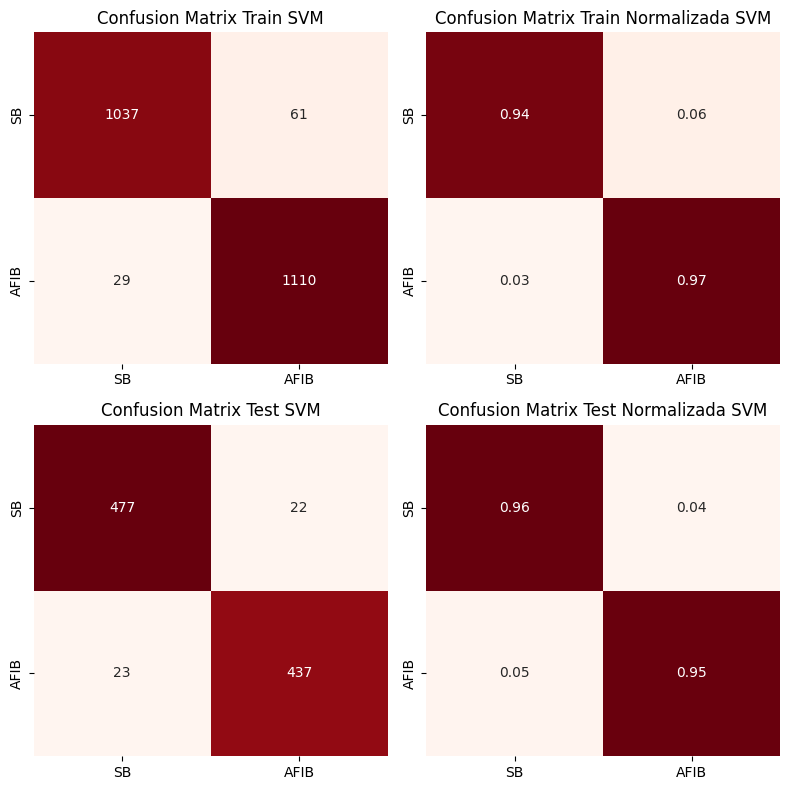

In [98]:
# Crear la figura
fig = plt.figure(figsize=(8, 8))

# Usar gridspec para el diseño de 2x2 subplots
gs = fig.add_gridspec(2, 2)

# Primer subplot: Confusión en entrenamiento, sin normalizar
ax1 = fig.add_subplot(gs[0, 0])
mc_train = confusion_matrix(y_trains, y_train_pred)
sns.heatmap(mc_train, annot=True, fmt='d', cmap='Reds', cbar=False,
            xticklabels=target_names, yticklabels=target_names, ax=ax1)
ax1.set_title('Confusion Matrix Train SVM')

# Segundo subplot: Confusión en entrenamiento, normalizada
ax2 = fig.add_subplot(gs[0, 1])
mc_train = confusion_matrix(y_trains, y_train_pred, normalize='true')
sns.heatmap(mc_train, annot=True, fmt='.2f', cmap='Reds', cbar=False,
            xticklabels=target_names, yticklabels=target_names, ax=ax2)
ax2.set_title('Confusion Matrix Train Normalizada SVM')

# Tercer subplot: Confusión en test, sin normalizar
ax3 = fig.add_subplot(gs[1, 0])
mc_test = confusion_matrix(y_tests, y_test_pred)
sns.heatmap(mc_test, annot=True, fmt='d', cmap='Reds', cbar=False,
            xticklabels=target_names, yticklabels=target_names, ax=ax3)
ax3.set_title('Confusion Matrix Test SVM')

# Cuarto subplot: Confusión en test, normalizada
ax4 = fig.add_subplot(gs[1, 1])
mc_test = confusion_matrix(y_tests, y_test_pred, normalize='true')
sns.heatmap(mc_test, annot=True, fmt='.2f', cmap='Reds', cbar=False,
            xticklabels=target_names, yticklabels=target_names, ax=ax4)
ax4.set_title('Confusion Matrix Test Normalizada SVM')

# Ajustar la disposición para evitar superposición
plt.tight_layout()
plt.show()



/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=T

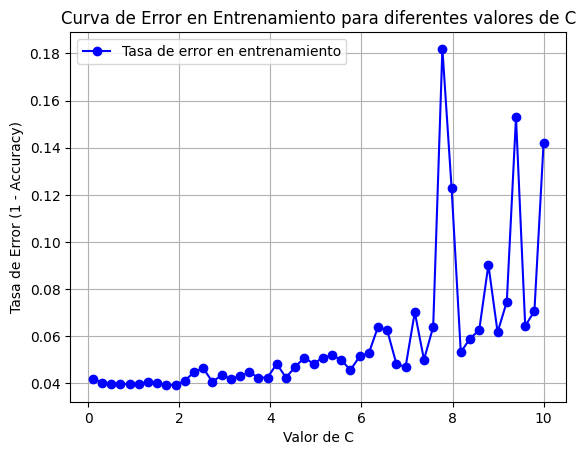

In [99]:
errors = []

# Iterar sobre un rango de valores para C (y también puedes probar gamma si usas RBF)
for C_value in np.linspace(0.1, 10, 50):  # Rango de valores para C
    svm_model = SVC(kernel='linear', C=C_value, random_state=42, max_iter=1000)
    svm_model.fit(X_train_scaled, y_trains)  # Entrenar el modelo

    # Predecir sobre el conjunto de entrenamiento
    y_train_pred = svm_model.predict(X_train_scaled)

    # Calcular tasa de error (1 - exactitud)
    error = 1 - accuracy_score(y_trains, y_train_pred)
    errors.append(error)  # Guardar el error

# Graficar la curva de error
plt.plot(np.linspace(0.1, 10, 50), errors, marker='o', linestyle='-', color='b', label='Tasa de error en entrenamiento')
plt.title('Curva de Error en Entrenamiento para diferentes valores de C')
plt.xlabel('Valor de C')
plt.ylabel('Tasa de Error (1 - Accuracy)')
plt.legend()
plt.grid(True)
plt.show()